In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import skimage as ski

def read_bin_image(filename, height, width, planes=1, mode=0, is_input=False):
    num_elements = height * width * planes
    
    if is_input:
        with open(filename, 'rb') as f:
            data = np.fromfile(f, dtype=np.uint8, count=num_elements)
        if data.size != num_elements:
            raise ValueError(f"File size mismatch")
            
    elif mode == 0:
        with open(filename, 'rb') as f:
            data = np.fromfile(f, dtype=np.uint16, count=num_elements)
        if data.size != num_elements:
            raise ValueError(f"File size mismatch")
        data = data.astype(np.uint8)
        
    elif mode == 1:
        # Read signed 16-bit Q9.7 format
        with open(filename, 'rb') as f:
            data = np.fromfile(f, dtype=np.int16, count=num_elements)
        if data.size != num_elements:
            raise ValueError(f"File size mismatch")
            
        # Convert to floats and divide by 128.0
        data = data.astype(np.float32) / 128.0

    if planes == 1:
        img = data.reshape((height, width))
    else:
        img = data.reshape((planes, height, width)).transpose(1, 2, 0)
    
    return img

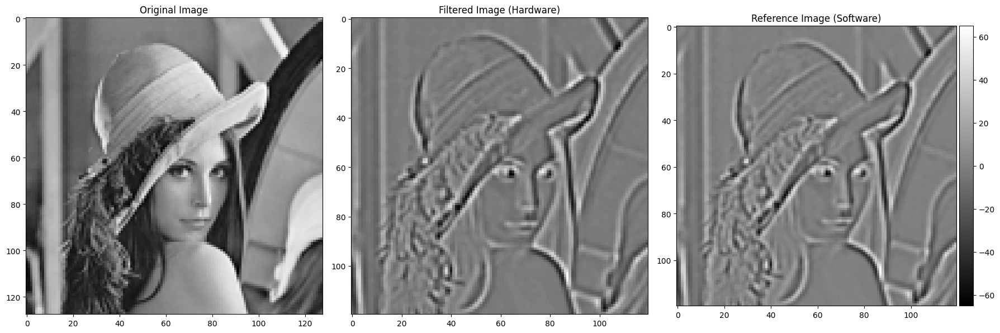

Images are identical: True


In [4]:
img_lena128 = read_bin_image('lena_128_clean.bin', 128, 128, planes=1, is_input=True)

img1 = read_bin_image('lena_128_log_9x9_signed.bin', 120, 120, planes=1, mode=1)
img2 = read_bin_image('lena_128_log_9x9_referent_signed.bin', 120, 120, planes=1, mode=1)

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(img_lena128, cmap='gray') 

plt.subplot(1, 3, 2)
plt.title("Filtered Image (Hardware)")
plt.imshow(img1, cmap='gray') 

plt.subplot(1, 3, 3)
plt.title("Reference Image (Software)")
ski.io.imshow(img2, cmap='gray')

plt.tight_layout()
plt.show()

print("Images are identical:", np.array_equal(img1, img2))

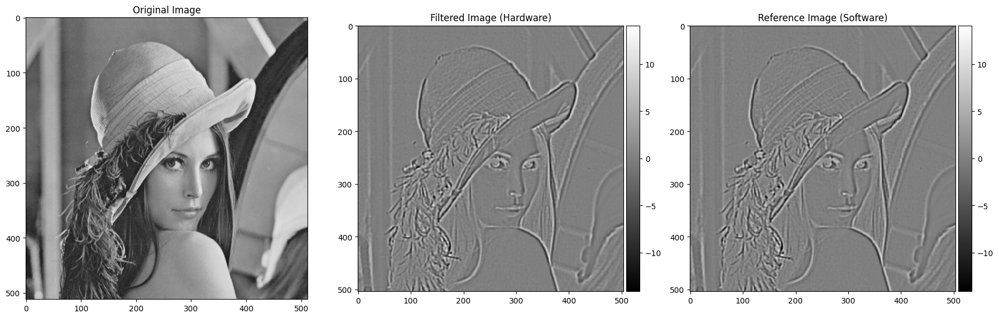

Images are identical: True


In [15]:
img_lena512 = read_bin_image('lena_512_clean.bin', 512, 512, planes=1, is_input=True)

img1 = read_bin_image('lena_512_log_9x9_signed.bin', 504, 504, planes=1, mode=1)
img2 = read_bin_image('lena_512_log_9x9_referent_signed.bin', 504, 504, planes=1, mode=1)

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.title("Original Image")
ski.io.imshow(img_lena512, cmap='gray') 

plt.subplot(1, 3, 2)
plt.title("Filtered Image (Hardware)")
ski.io.imshow(img1, cmap='gray') 

plt.subplot(1, 3, 3)
plt.title("Reference Image (Software)")
ski.io.imshow(img2, cmap='gray')

plt.tight_layout()
plt.show()

print("Images are identical:", np.array_equal(img1, img2))

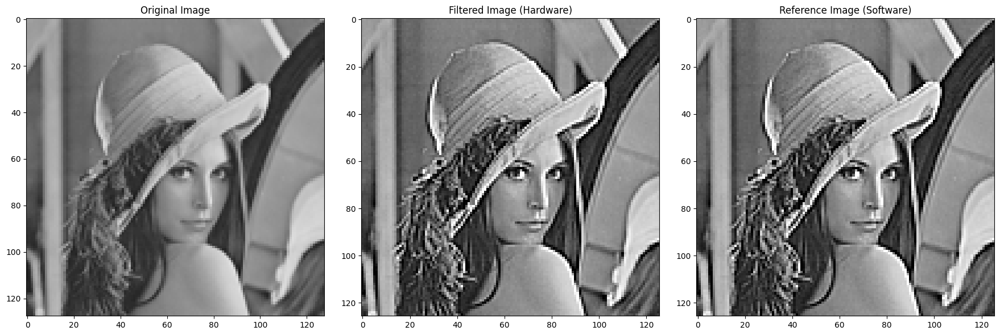

Images are identical: True


In [20]:
img_lena128 = read_bin_image('lena_128_clean.bin', 128, 128, planes=1, is_input=True)

img1 = read_bin_image('lena_128_sharp_box_3x3.bin', 126, 126, planes=1, mode=0)
img2 = read_bin_image('lena_128_sharp_box_3x3_referent.bin', 126, 126, planes=1, mode=0)

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.title("Original Image")
ski.io.imshow(img_lena128, cmap='gray') 

plt.subplot(1, 3, 2)
plt.title("Filtered Image (Hardware)")
ski.io.imshow(img1, cmap='gray') 

plt.subplot(1, 3, 3)
plt.title("Reference Image (Software)")
ski.io.imshow(img2, cmap='gray')

plt.tight_layout()
plt.show()

print("Images are identical:", np.array_equal(img1, img2))

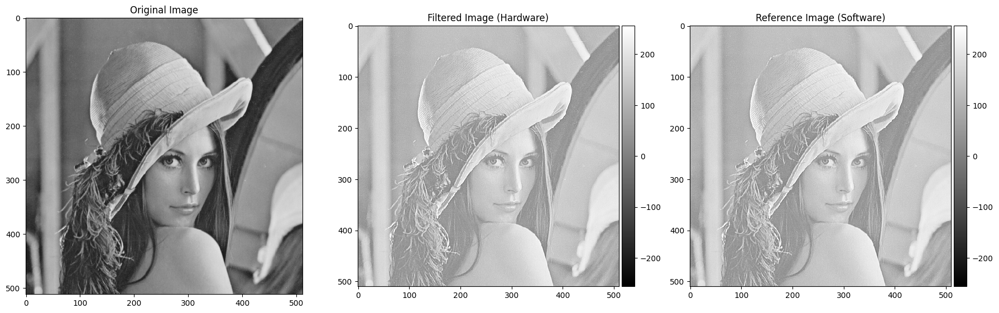

Images are identical: True
min: -45.429688
max: 255.99219
mean: 123.6066
std: 51.330967


In [33]:
img_lena512 = read_bin_image('lena_512_clean.bin', 512, 512, planes=1, is_input=True)

img1 = read_bin_image('lena_512_sharp_box_3x3_signed.bin', 510, 510, planes=1, mode=1)
img2 = read_bin_image('lena_512_sharp_box_3x3_referent_signed.bin', 510, 510, planes=1, mode=1)

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.title("Original Image")
ski.io.imshow(img_lena512) 

plt.subplot(1, 3, 2)
plt.title("Filtered Image (Hardware)")
ski.io.imshow(img1, cmap='gray') 

plt.subplot(1, 3, 3)
plt.title("Reference Image (Software)")
ski.io.imshow(img2, cmap = 'gray')

plt.tight_layout()
plt.show()

print("Images are identical:", np.array_equal(img1, img2))

img1_raw = img1

print("min:", img1_raw.min())
print("max:", img1_raw.max())
print("mean:", img1_raw.mean())
print("std:", img1_raw.std())

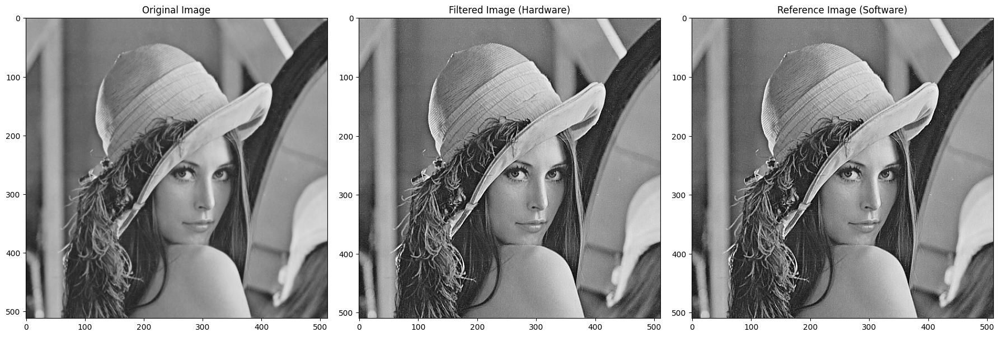

In [34]:
def show_sharpened(ax, img, title):
    display = np.clip(img, 0, 255).astype(np.uint8)
    ax.imshow(display, cmap='gray', vmin=0, vmax=255)
    ax.set_title(title)

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
show_sharpened(axes[0], img_lena512.astype(float), "Original Image")
show_sharpened(axes[1], img1, "Filtered Image (Hardware)")
show_sharpened(axes[2], img2, "Reference Image (Software)")
plt.tight_layout()
plt.show()

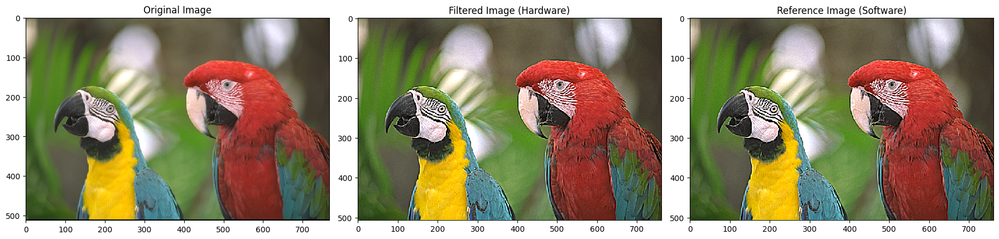

Images are identical: True


In [35]:
img_papagaji = read_bin_image('parrots.bin', 512, 768, planes=3, is_input=True)

img1 = read_bin_image('parrots_sharp_box_7x7.bin', 506, 762, planes=3, mode=0)
img2 = read_bin_image('parrots_sharp_box_7x7_referent.bin', 506, 762, planes=3, mode=0)

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.title("Original Image")
ski.io.imshow(img_papagaji, cmap='gray') 

plt.subplot(1, 3, 2)
plt.title("Filtered Image (Hardware)")
ski.io.imshow(img1, cmap='gray') 

plt.subplot(1, 3, 3)
plt.title("Reference Image (Software)")
ski.io.imshow(img2, cmap='gray')

plt.tight_layout()
plt.show()

print("Images are identical:", np.array_equal(img1, img2))

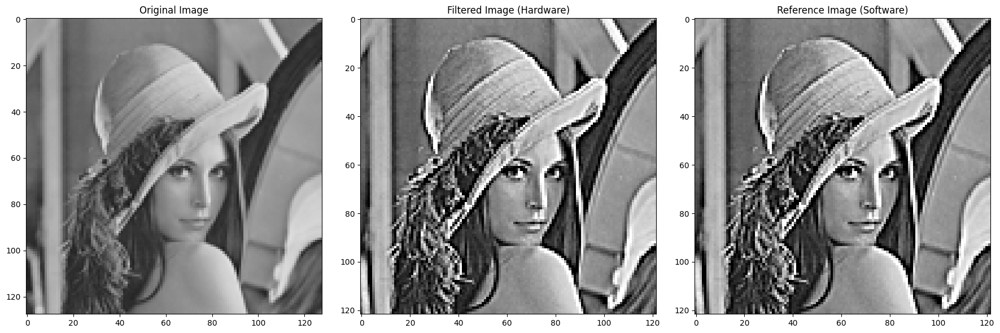

Images are identical: True


In [36]:
img_lena128 = read_bin_image('lena_128_clean.bin', 128, 128, planes=1, is_input=True)

img1 = read_bin_image('lena_128_sharp_gaus_7x7.bin', 122, 122, planes=1, mode=0)
img2 = read_bin_image('lena_128_sharp_gaus_7x7_referent.bin', 122, 122, planes=1, mode=0)

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.title("Original Image")
ski.io.imshow(img_lena128, cmap='gray') 

plt.subplot(1, 3, 2)
plt.title("Filtered Image (Hardware)")
ski.io.imshow(img1, cmap='gray') 

plt.subplot(1, 3, 3)
plt.title("Reference Image (Software)")
ski.io.imshow(img2, cmap='gray')

plt.tight_layout()
plt.show()

print("Images are identical:", np.array_equal(img1, img2))

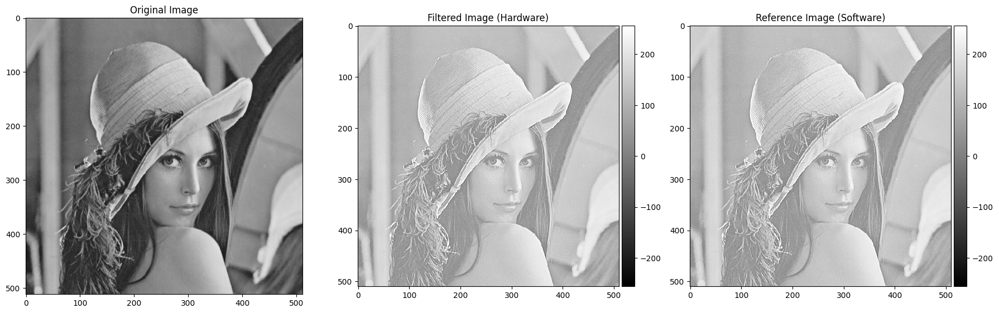

Images are identical: True
min: -68.09375
max: 255.99219
mean: 123.549065
std: 52.533875


In [37]:
img_lena512 = read_bin_image('lena_512_clean.bin', 512, 512, planes=1, is_input=True)

img1 = read_bin_image('lena_512_sharp_gaus_3x3_signed.bin', 510, 510, planes=1, mode=1)
img2 = read_bin_image('lena_512_sharp_gaus_3x3_referent_signed.bin', 510, 510, planes=1, mode=1)

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.title("Original Image")
ski.io.imshow(img_lena512) 

plt.subplot(1, 3, 2)
plt.title("Filtered Image (Hardware)")
ski.io.imshow(img1, cmap='gray') 

plt.subplot(1, 3, 3)
plt.title("Reference Image (Software)")
ski.io.imshow(img2, cmap = 'gray')

plt.tight_layout()
plt.show()

print("Images are identical:", np.array_equal(img1, img2))

img1_raw = img1  # after your / 128.0 division

print("min:", img1_raw.min())
print("max:", img1_raw.max())
print("mean:", img1_raw.mean())
print("std:", img1_raw.std())

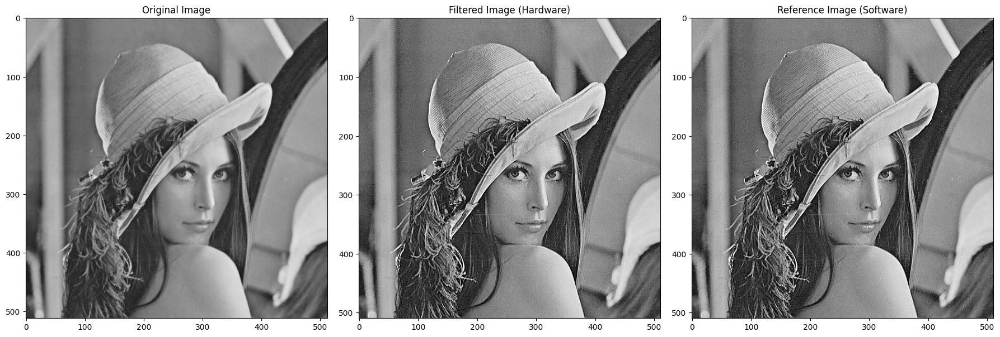

In [38]:
def show_sharpened(ax, img, title):
    display = np.clip(img, 0, 255).astype(np.uint8)
    ax.imshow(display, cmap='gray', vmin=0, vmax=255)
    ax.set_title(title)

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
show_sharpened(axes[0], img_lena512.astype(float), "Original Image")
show_sharpened(axes[1], img1, "Filtered Image (Hardware)")
show_sharpened(axes[2], img2, "Reference Image (Software)")
plt.tight_layout()
plt.show()

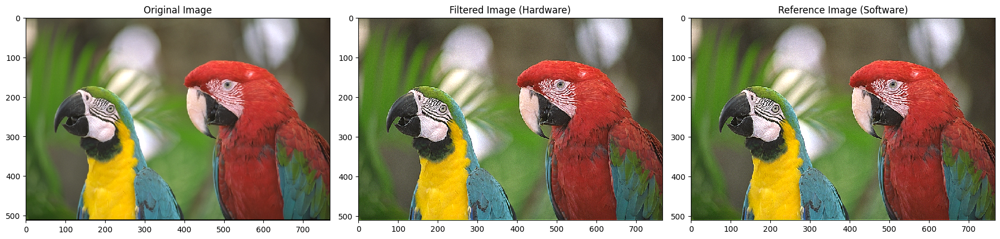

Images are identical: True


In [39]:
img_papagaji = read_bin_image('parrots.bin', 512, 768, planes=3, is_input=True)

img1 = read_bin_image('parrots_sharp_gaus_3x3.bin', 510, 766, planes=3, mode=0)
img2 = read_bin_image('parrots_sharp_gaus_3x3_referent.bin', 510, 766, planes=3, mode=0)

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.title("Original Image")
ski.io.imshow(img_papagaji, cmap='gray') 

plt.subplot(1, 3, 2)
plt.title("Filtered Image (Hardware)")
ski.io.imshow(img1, cmap='gray') 

plt.subplot(1, 3, 3)
plt.title("Reference Image (Software)")
ski.io.imshow(img2, cmap='gray')

plt.tight_layout()
plt.show()

print("Images are identical:", np.array_equal(img1, img2))

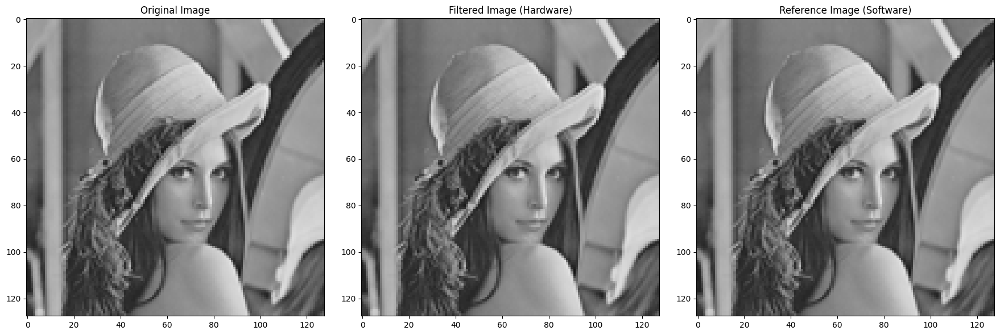

Images are identical: True


In [10]:
img_lena128 = read_bin_image('lena_128_clean.bin', 128, 128, planes=1, is_input=True)

img1 = read_bin_image('lena_128_bypass_1x1.bin', 128, 128, planes=1, mode=0)
img2 = read_bin_image('lena_128_bypass_1x1_referent.bin', 128, 128, planes=1, mode=0)

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.title("Original Image")
ski.io.imshow(img_lena128, cmap='gray') 

plt.subplot(1, 3, 2)
plt.title("Filtered Image (Hardware)")
ski.io.imshow(img1, cmap='gray') 

plt.subplot(1, 3, 3)
plt.title("Reference Image (Software)")
ski.io.imshow(img2, cmap='gray')

plt.tight_layout()
plt.show()

print("Images are identical:", np.array_equal(img1, img2))

In [1]:
img_lena512 = read_bin_image('lena_512_clean.bin', 512, 512, planes=1, is_input=True)

img1 = read_bin_image('lena_512_bypass_7x7.bin', 506, 506, planes=1, mode=0)
img2 = read_bin_image('lena_512_bypass_7x7_referent.bin', 506, 506, planes=1, mode=0)

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.title("Original Image")
ski.io.imshow(img_lena512) 

plt.subplot(1, 3, 2)
plt.title("Filtered Image (Hardware)")
ski.io.imshow(img1, cmap='gray') 

plt.subplot(1, 3, 3)
plt.title("Reference Image (Software)")
ski.io.imshow(img2, cmap = 'gray')

plt.tight_layout()
plt.show()

print("Images are identical:", np.array_equal(img1, img2))

NameError: name 'read_bin_image' is not defined

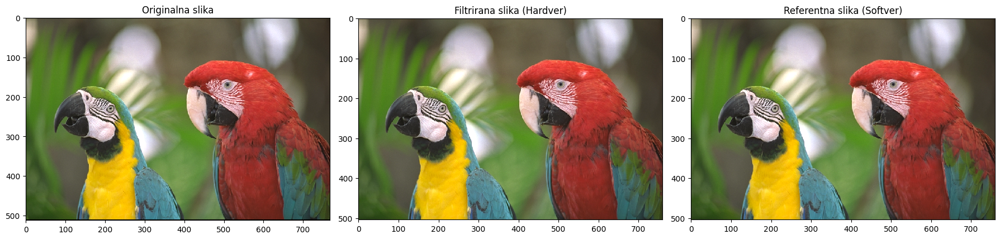

Images are identical: True


In [21]:
img_papagaji = read_bin_image('parrots.bin', 512, 768, planes=3, is_input=True)

img1 = read_bin_image('parrots_bypass_9x9.bin', 504, 760, planes=3, mode=0)
img2 = read_bin_image('parrots_bypass_9x9_referent.bin', 504, 760, planes=3, mode=0)

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.title("Originalna slika")
ski.io.imshow(img_papagaji, cmap='gray') 

plt.subplot(1, 3, 2)
plt.title("Filtrirana slika (Hardver)")
ski.io.imshow(img1, cmap='gray') 

plt.subplot(1, 3, 3)
plt.title("Referentna slika (Softver)")
ski.io.imshow(img2, cmap='gray')

plt.tight_layout()
plt.savefig(r"C:\Users\savic\OneDrive\Desktop\slike za izvjestaj\parrots_bypass_9x9.png")
plt.show()

print("Images are identical:", np.array_equal(img1, img2))

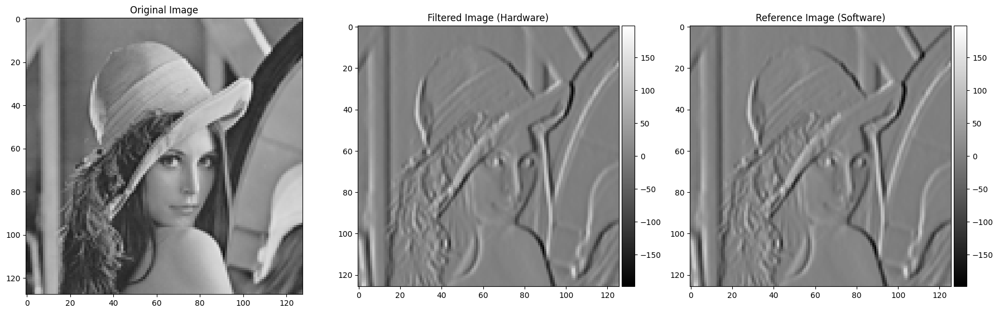

Images are identical: True


In [13]:
img_lena128 = read_bin_image('lena_128_clean.bin', 128, 128, planes=1, is_input=True)

img1 = read_bin_image('lena_128_sobel_X_3x3_signed.bin', 126, 126, planes=1, mode=1)
img2 = read_bin_image('lena_128_sobel_X_3x3_referent_signed.bin', 126, 126, planes=1, mode=1)

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.title("Original Image")
ski.io.imshow(img_lena128, cmap='gray') 

plt.subplot(1, 3, 2)
plt.title("Filtered Image (Hardware)")
ski.io.imshow(img1, cmap='gray') 

plt.subplot(1, 3, 3)
plt.title("Reference Image (Software)")
ski.io.imshow(img2, cmap='gray')

plt.tight_layout()
plt.show()

print("Images are identical:", np.array_equal(img1, img2))

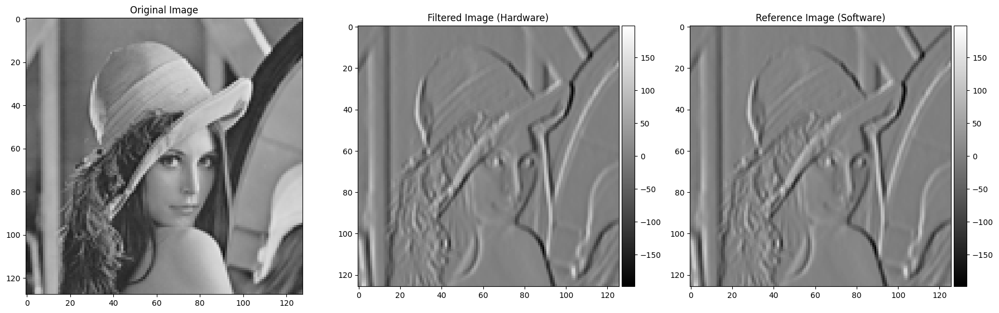

Images are identical: True


In [18]:
img_lena128 = read_bin_image('lena_128_clean.bin', 128, 128, planes=1, is_input=True)

img1 = read_bin_image('lena_128_prewitt_X_3x3_signed.bin', 126, 126, planes=1, mode=1)
img2 = read_bin_image('lena_128_prewitt_X_3x3_referent_signed.bin', 126, 126, planes=1, mode=1)

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.title("Original Image")
ski.io.imshow(img_lena128, cmap='gray') 

plt.subplot(1, 3, 2)
plt.title("Filtered Image (Hardware)")
ski.io.imshow(img1, cmap='gray') 

plt.subplot(1, 3, 3)
plt.title("Reference Image (Software)")
ski.io.imshow(img2, cmap='gray')

plt.tight_layout()
plt.show()

print("Images are identical:", np.array_equal(img1, img2))

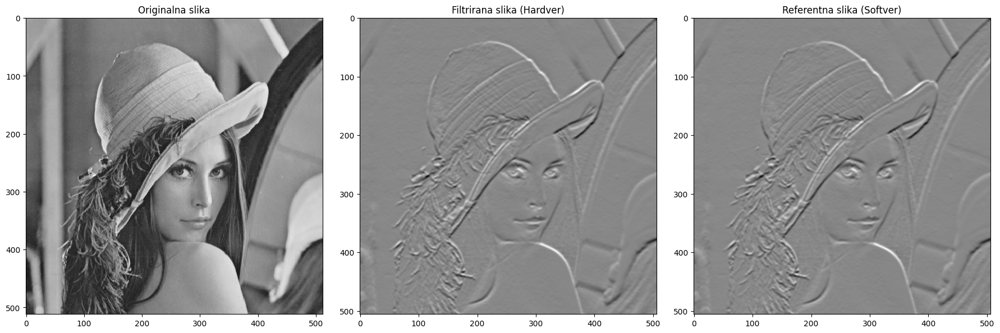

Images are identical: True


In [119]:
img_lena512 = read_bin_image('lena_512_clean.bin', 512, 512, planes=1, is_input=True)

img1 = read_bin_image('lena_512_sobel_Y_7x7_signed.bin', 506, 506, planes=1, mode=1)
img2 = read_bin_image('lena_512_sobel_Y_7x7_referent_signed.bin', 506, 506, planes=1, mode=1)

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.title("Originalna slika")
ski.io.imshow(img_lena512, cmap = 'gray') 

plt.subplot(1, 3, 2)
plt.title("Filtrirana slika (Hardver)")
plt.imshow(img1, cmap='gray') 

plt.subplot(1, 3, 3)
plt.title("Referentna slika (Softver)")
plt.imshow(img2, cmap = 'gray')

plt.tight_layout()
plt.show()

print("Images are identical:", np.array_equal(img1, img2))

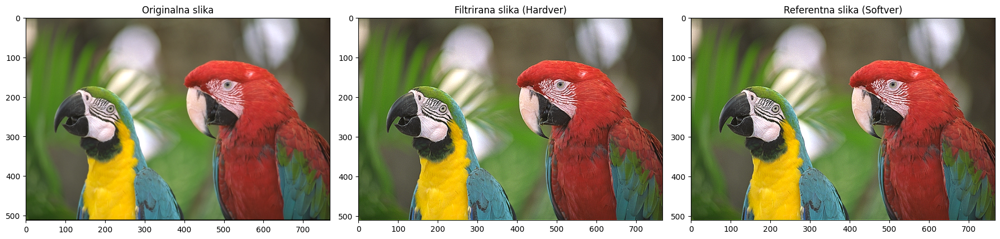

Images are identical: True


In [109]:
img_papagaji = read_bin_image('parrots.bin', 512, 768, planes=3, is_input=True)

img1 = read_bin_image('parrots_sharp_gaus_3x3.bin', 510, 766, planes=3, mode=0)
img2 = read_bin_image('parrots_sharp_gaus_3x3_referent.bin', 510, 766, planes=3, mode=0)

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.title("Originalna slika")
plt.imshow(img_papagaji, cmap='gray') 

plt.subplot(1, 3, 2)
plt.title("Filtrirana slika (Hardver)")
plt.imshow(img1, cmap='gray') 

plt.subplot(1, 3, 3)
plt.title("Referentna slika (Softver)")
plt.imshow(img2, cmap='gray')

plt.tight_layout()
plt.show()

print("Images are identical:", np.array_equal(img1, img2))